In [2]:
import numpy as np
import pandas as pd
import pylab as pl
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
import seaborn as sns
from sklearn.utils import shuffle
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score, GridSearchCV

In [8]:
data = pd.read_csv('C:/Users/maity/OneDrive/Desktop/bakapart3/creditcard.csv')

In [9]:
data.info()
data[0:10]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of amount')

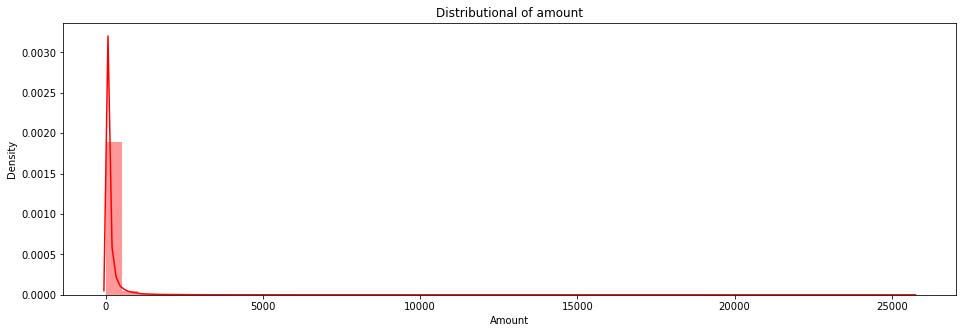

In [10]:
f, axes = plt.subplots(1,1,figsize = (16,5))
g1 = sns.distplot(data["Amount"], color="red", ax=axes)
plt.title('Distributional of amount')

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V1')

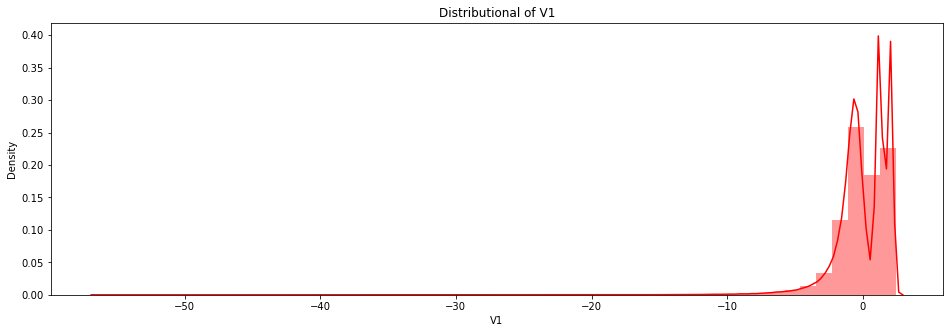

In [11]:
f, axes = plt.subplots(1,1,figsize = (16,5))
g1 = sns.distplot(data["V1"], color="red", ax=axes)
plt.title("Distributional of V1")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V2')

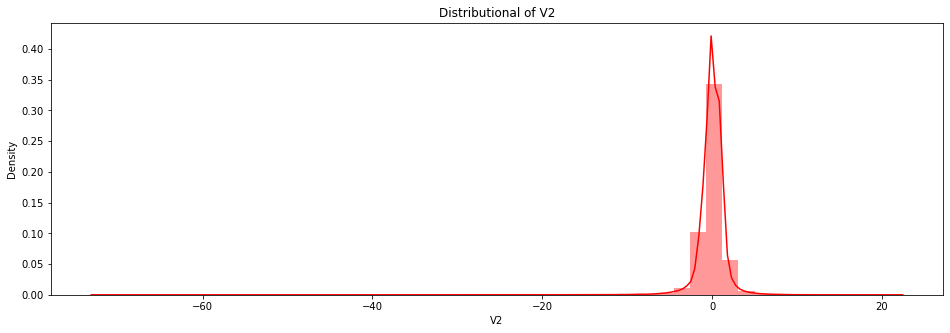

In [12]:
f, axes = plt.subplots(1,1, figsize= (16,5))
g1 = sns.distplot(data["V2"], color="red", ax=axes)
plt.title("Distributional of V2")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V4')

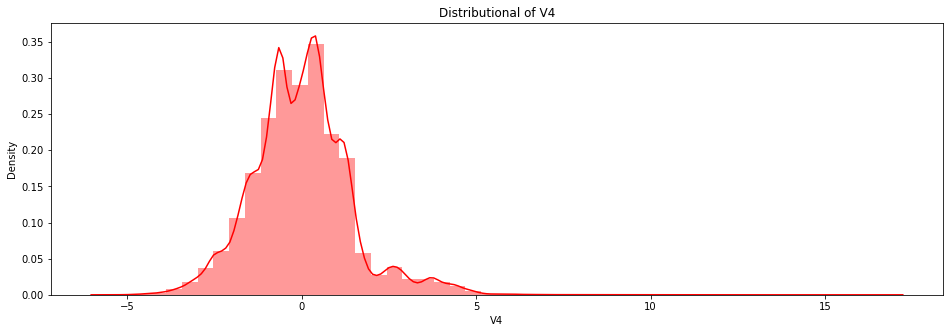

In [13]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V4"],color = "red" , ax=axes)
plt.title("Distributional of V4")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V5')

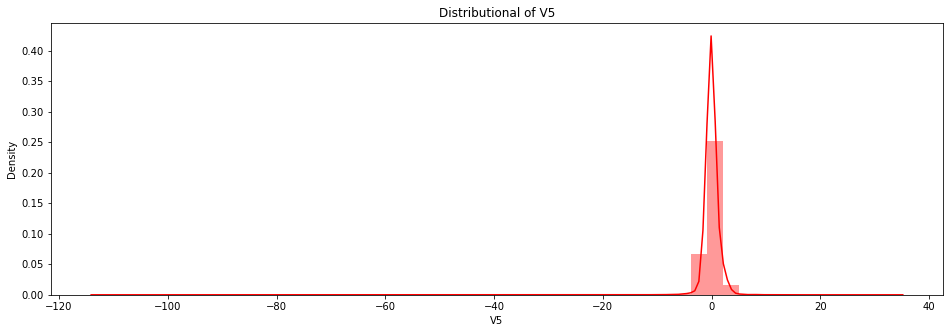

In [15]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V5"],color="red", ax=axes)
plt.title("Distributional of V5")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V6')

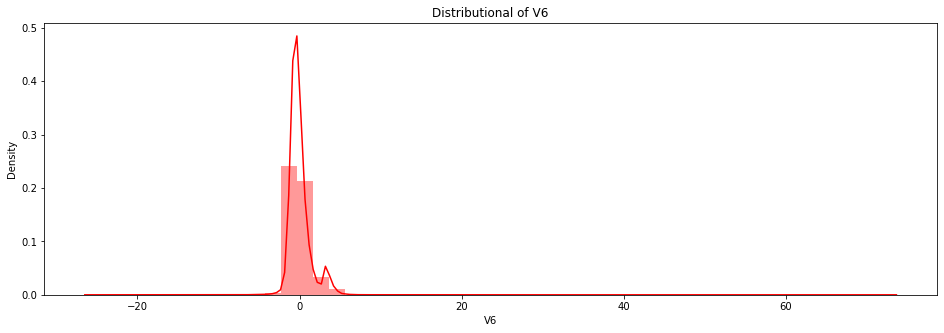

In [18]:

f, axes = plt.subplots(1,1, figsize = (16, 5))
g1 = sns.distplot(data["V6"], color="red",ax = axes)
plt.title("Distributional of V6")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V7')

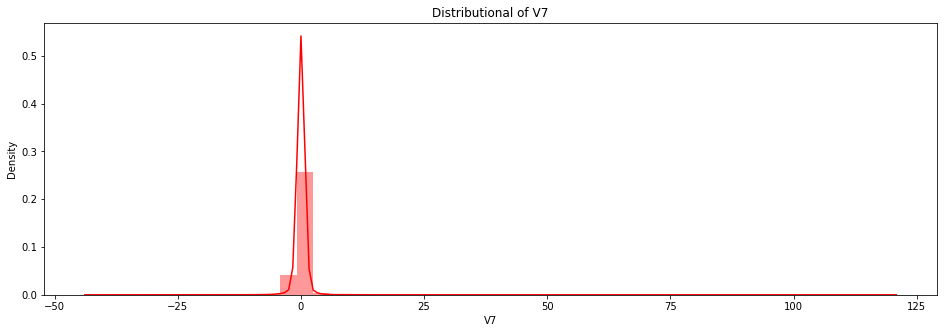

In [19]:
f, axes = plt.subplots(1,1, figsize=(16,5))
g1 = sns.distplot(data["V7"], color = "red", ax = axes)
plt.title("Distributional of V7")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V8')

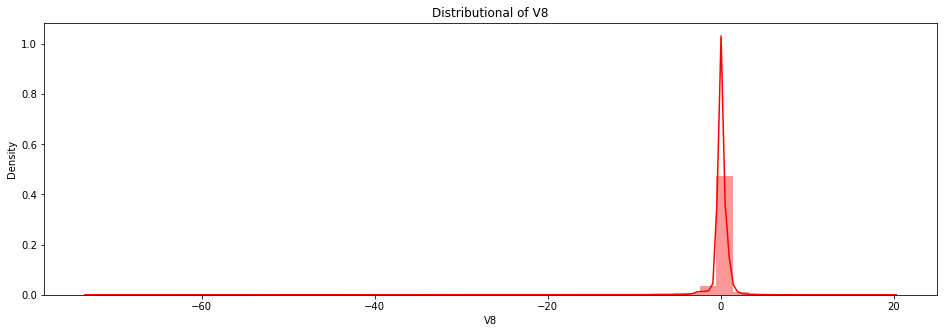

In [20]:
f , axes = plt.subplots(1,1, figsize = (16,5))
g1 = sns.distplot(data["V8"], color="red", ax = axes)
plt.title("Distributional of V8")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V9')

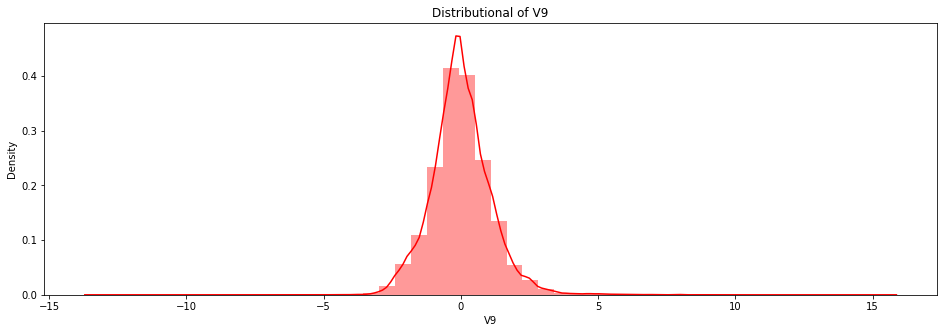

In [21]:
f, axes = plt.subplots(1,1, figsize = (16,5))
g1 = sns.distplot(data["V9"], color="red", ax=axes)
plt.title("Distributional of V9")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V10')

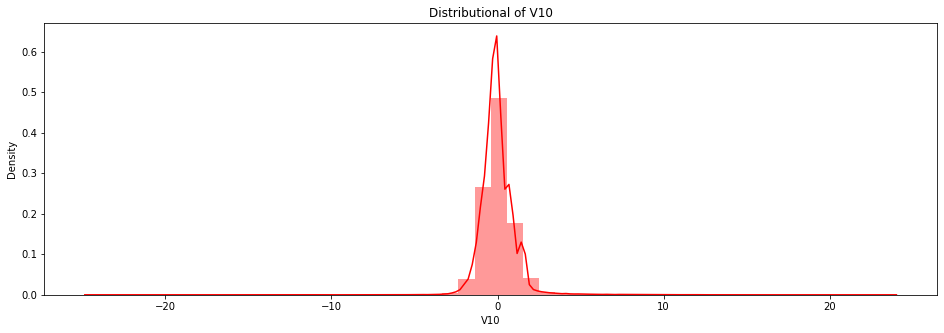

In [22]:
f , axes = plt.subplots(1, 1, figsize=(16,5))
g1 = sns.distplot(data["V10"], color="red", ax=axes)
plt.title("Distributional of V10")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V11')

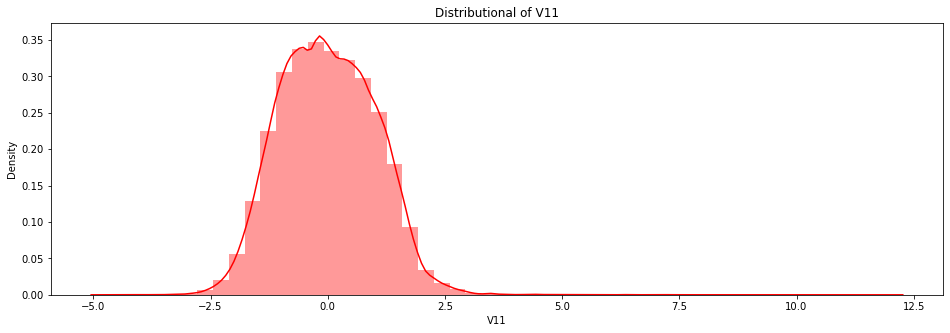

In [23]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V11"], color = "red", ax=axes)
plt.title("Distributional of V11")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V12')

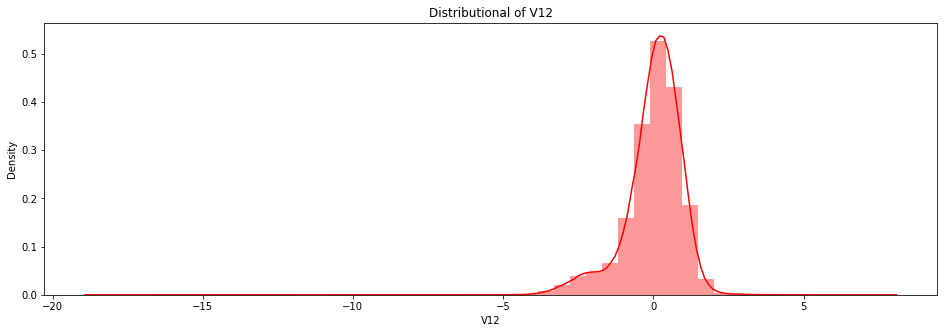

In [24]:
f,axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V12"], color="red", ax = axes)
plt.title("Distributional of V12")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V13')

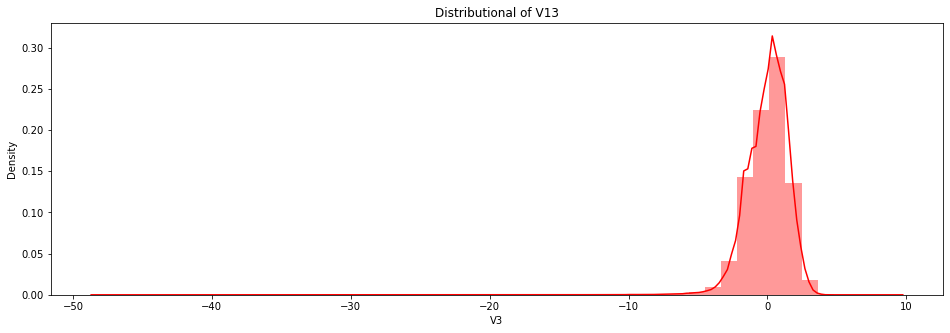

In [25]:
f, axes = plt.subplots(1,1,figsize= (16,5))
g1 = sns.distplot(data["V3"], color="red" , ax=axes)
plt.title("Distributional of V13")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of V14')

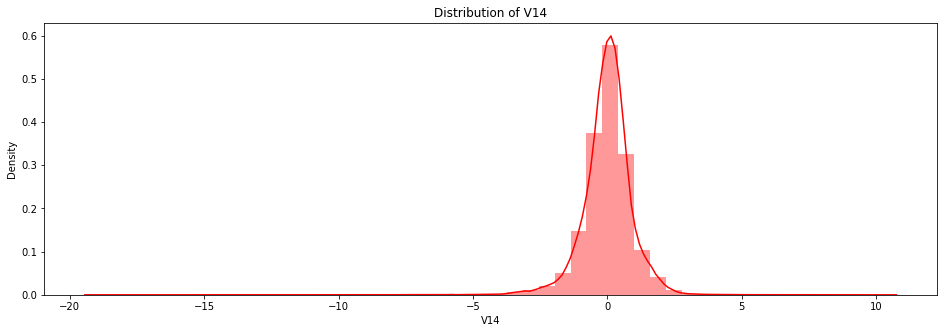

In [26]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V14"], color="red", ax=axes)
plt.title("Distribution of V14")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V15')

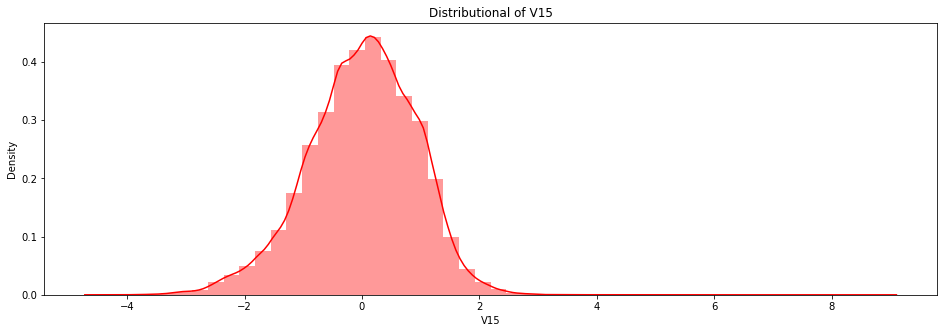

In [27]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V15"], color="red", ax=axes)
plt.title("Distributional of V15")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of V16')

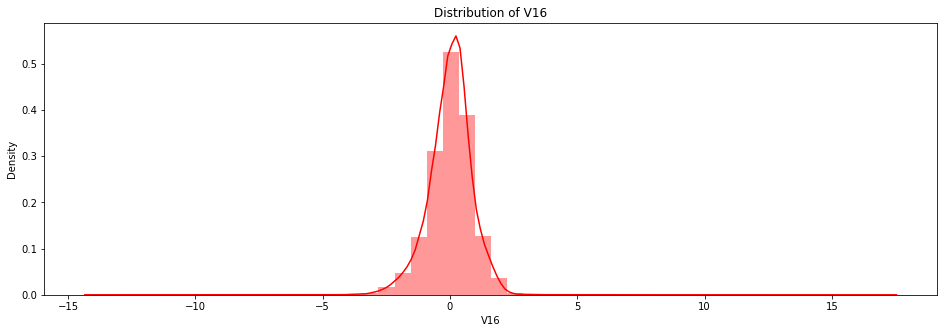

In [28]:
f, axes = plt.subplots(1,1, figsize=(16,5))
g1 = sns.distplot(data["V16"], color="red", ax=axes)
plt.title("Distribution of V16")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of V17')

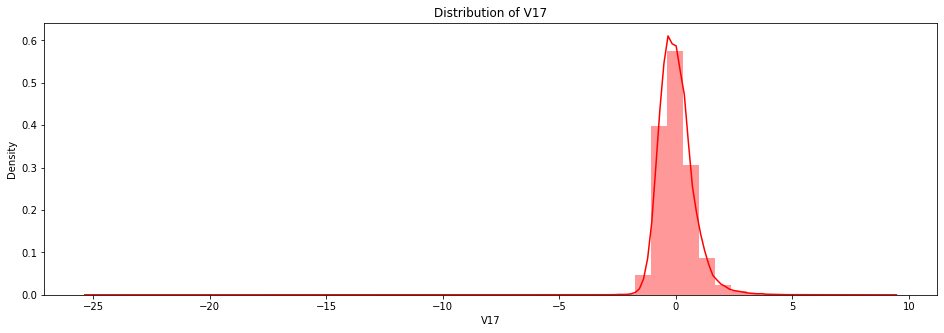

In [29]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V17"], color="red", ax=axes)
plt.title("Distribution of V17")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V18')

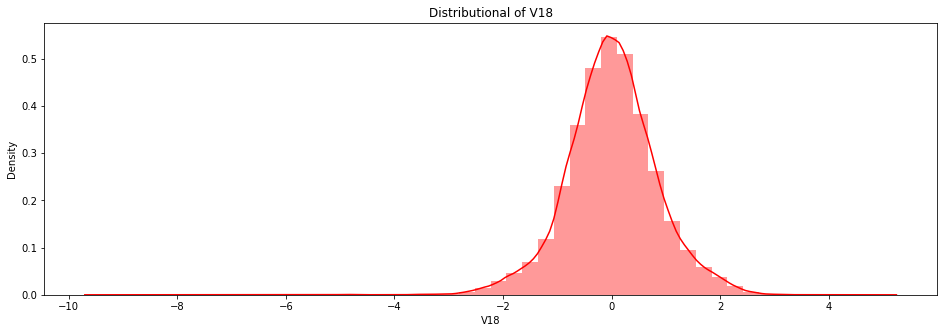

In [30]:
f, axes = plt.subplots(1,1, figsize =(16,5))
g1 = sns.distplot(data["V18"],color="red",ax=axes)
plt.title("Distributional of V18")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of V19')

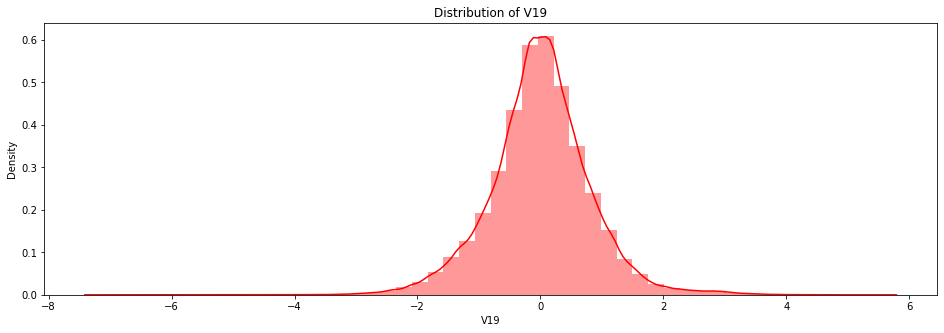

In [31]:
f , axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V19"], color="red", ax=axes)
plt.title("Distribution of V19")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V20')

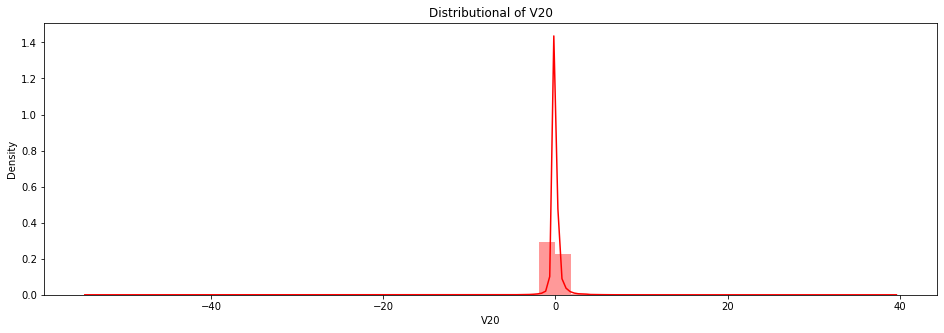

In [33]:
f, axes = plt.subplots(1,1,figsize = (16,5))
g1 = sns.distplot(data["V20"], color="red", ax= axes)
plt.title("Distributional of V20")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of V21')

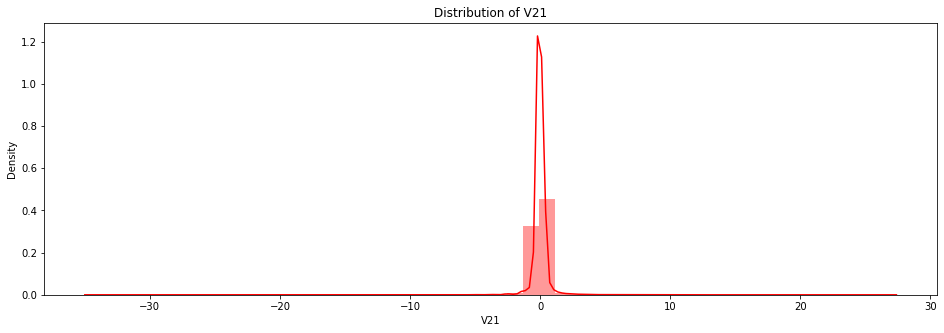

In [34]:
f , axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V21"], color="red" , ax=axes)
plt.title("Distribution of V21")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V21')

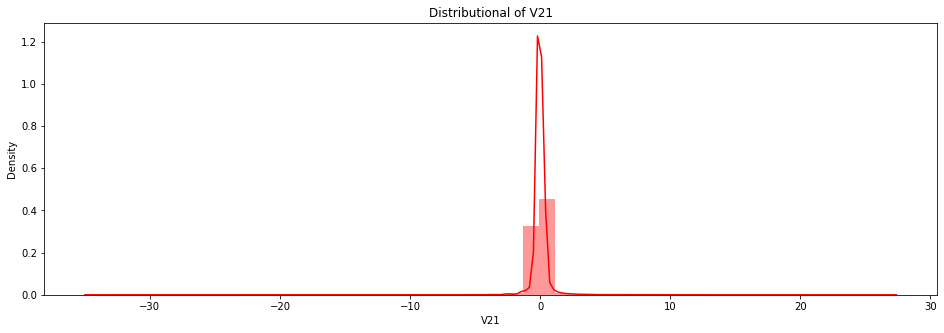

In [35]:
f , axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V21"], color="red", ax=axes)
plt.title("Distributional of V21")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V22')

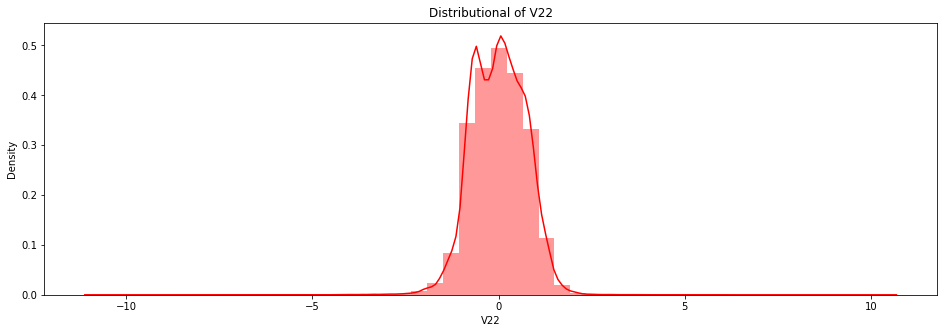

In [36]:
f, axes  = plt.subplots(1,1, figsize =(16,5))
g1 = sns.distplot(data["V22"], color="red", ax=axes)
plt.title("Distributional of V22")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V23')

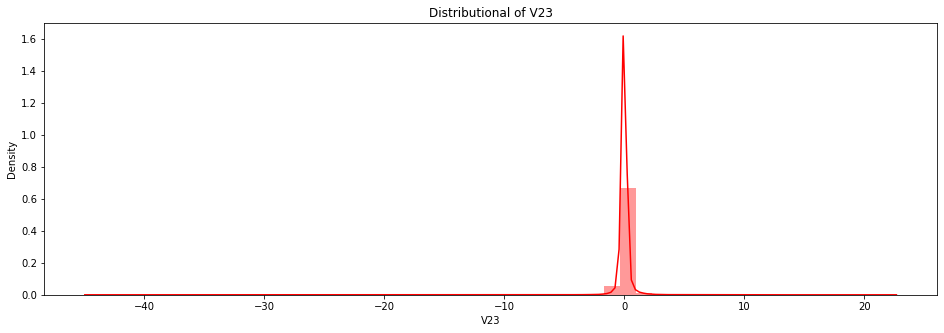

In [37]:
f, axes = plt.subplots(1,1, figsize=(16,5))
g1 = sns.distplot(data["V23"], color="red", ax=axes)
plt.title("Distributional of V23")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V24')

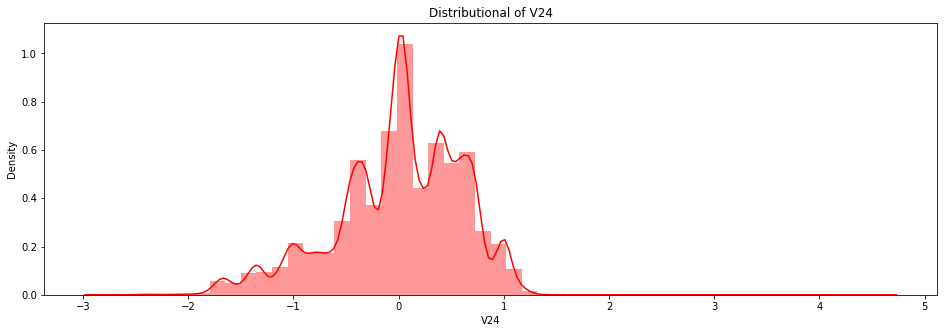

In [38]:
f, axes = plt.subplots(1,1, figsize=(16,5))
g1 = sns.distplot(data["V24"], color= "red" , ax= axes)
plt.title("Distributional of V24")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V24')

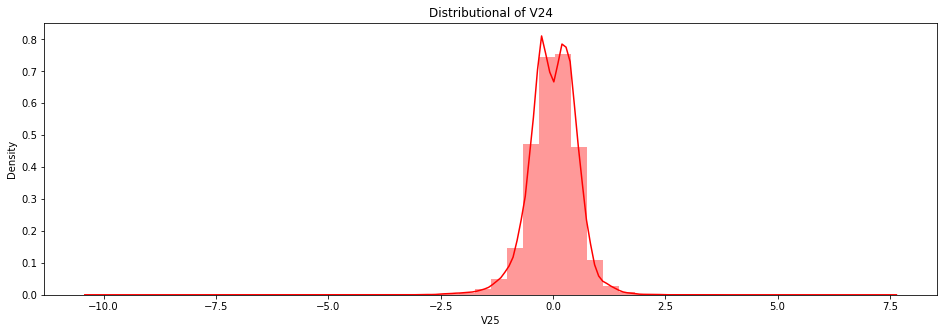

In [39]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V25"], color="red" , ax=axes)
plt.title("Distributional of V24")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V25')

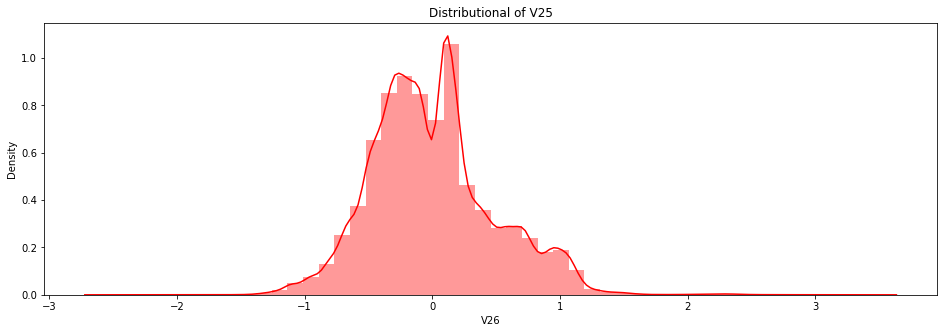

In [40]:
f, axes = plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V26"] , color="red", ax=axes)
plt.title("Distributional of V25")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of V26')

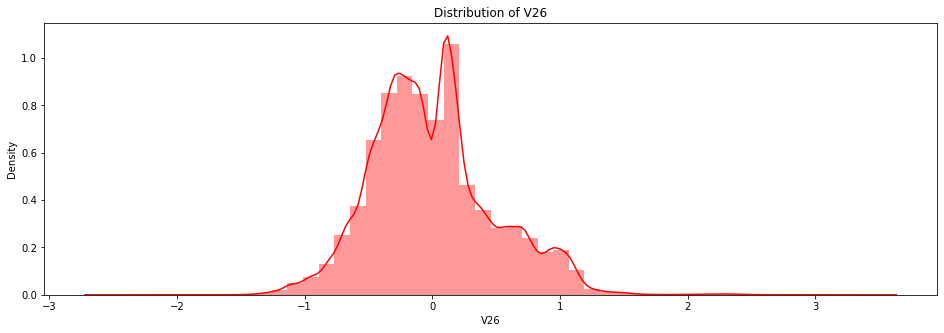

In [41]:
f, axes = plt.subplots(1,1,figsize= (16,5))
g1 = sns.distplot(data["V26"] , color = "red", ax=axes)
plt.title("Distribution of V26")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V27')

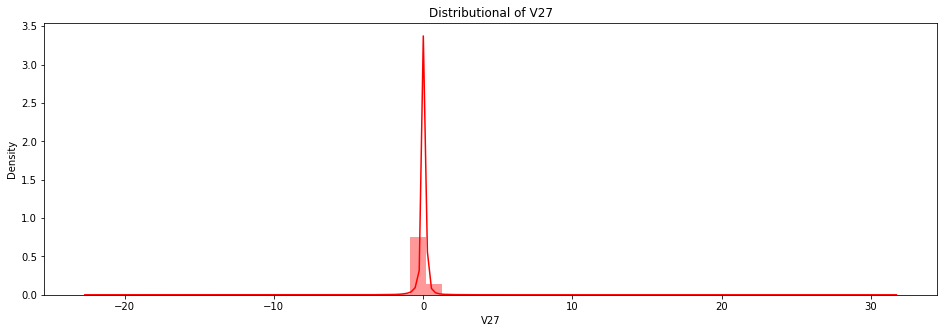

In [42]:
f , axes = plt.subplots(1, 1, figsize = (16,5))
g1 = sns.distplot(data["V27"], color="red", ax=axes)
plt.title("Distributional of V27")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distributional of V28')

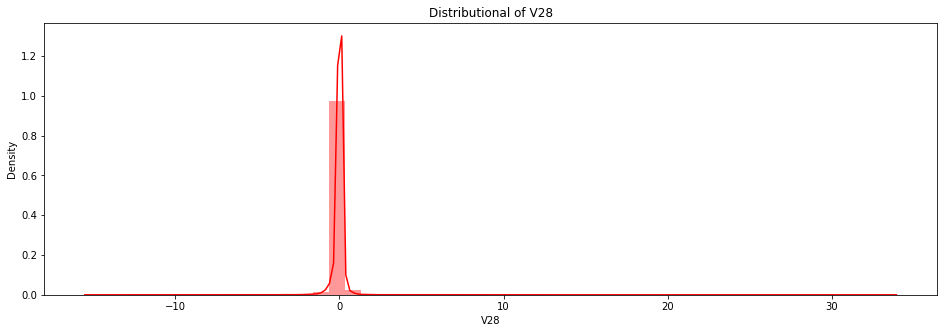

In [43]:
f, axes= plt.subplots(1,1,figsize=(16,5))
g1 = sns.distplot(data["V28"] , color="red", ax=axes)
plt.title("Distributional of V28")

In [45]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go

ep = data['Class'].value_counts().reset_index()
ep.columns = [
    'Class', 
    'percent'
]
ep['percent'] /= len(data)

fig = px.pie(
    ep, 
    names='Class', 
    values='percent', 
    title='Percentage of Class', 
    width=800,
    height=500 
)

fig.show()

ModuleNotFoundError: No module named 'plotly'

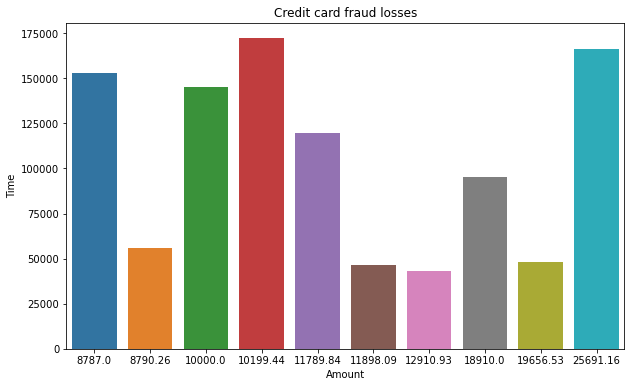

In [46]:
#Top 10 credit card fraud losses by time
top_fraud = data.sort_values(by='Amount', ascending=False)[:10]
figure = plt.figure(figsize=(10,6))
sns.barplot(y=top_fraud.Time, x=top_fraud.Amount)
plt.xticks()
plt.xlabel('Amount')
plt.ylabel('Time')
plt.title('Credit card fraud losses')
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


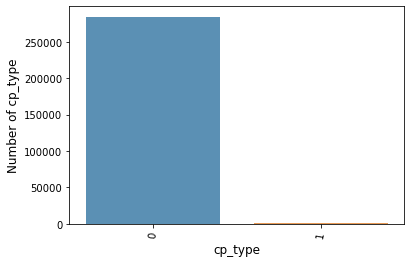

In [48]:
cnt_pro = data['Class'].value_counts()
plt.figure(figsize=(6,4))
sns.barplot(cnt_pro.index,cnt_pro.values, alpha=0.8)
plt.ylabel('Number of cp_type', fontsize=12)
plt.xlabel('cp_type', fontsize=12)
plt.xticks(rotation=80)
plt.show();

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


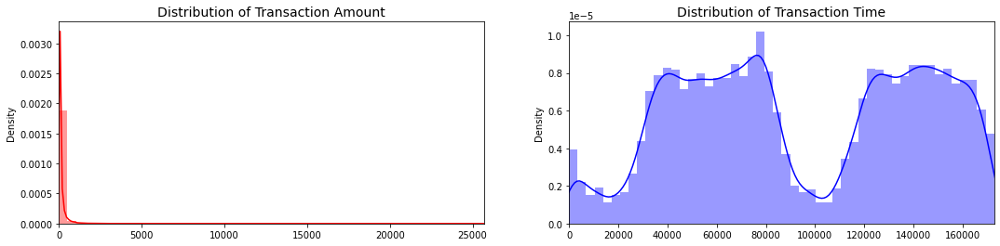

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

amount_val = data['Amount'].values
time_val = data['Time'].values

sns.distplot(amount_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of Transaction Amount', fontsize=14)
ax[0].set_xlim([min(amount_val), max(amount_val)])

sns.distplot(time_val, ax=ax[1], color='b')
ax[1].set_title('Distribution of Transaction Time', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])



plt.show()


In [50]:
print("Any missing sample in test set:" , data.isnull().values.any(),"\n")

Any missing sample in test set: False 



In [52]:
train_outcome = pd.crosstab(index=data["Class"], columns="count")
train_outcome

col_0,count
Class,
0,284315
1,492


In [54]:
display(data[["Time","Amount",]].groupby(["Amount"]).agg(["max",'mean',"min"]).style.background_gradient(cmap="ocean"))